### import libraries

In [1]:
import numpy as np
import os
import pickle
import copy
import time
import h5py
from pprint import pprint
import joblib
import gc
import matplotlib.pyplot as plt

import lenstronomy.Util.util as util
from lenstronomy.Workflow.fitting_sequence import FittingSequence
from lenstronomy.Plots.model_plot import ModelPlot
from lenstronomy.Plots import chain_plot
from lenstronomy.Sampling.parameters import Param
from lenstronomy.Util import mask_util
from lenstronomy.Data.coord_transforms import Coordinates
from lenstronomy.Util.util import array2image

cwd = os.getcwd()
base_path, _ = os.path.split(cwd)
print('Base directory path:', base_path)

from paperfig import *

set_fontscale(2.)

import seaborn as sns

cmap = sns.cubehelix_palette(start=0.5, rot=-1.5, gamma=1, hue=1, light=-.6, dark=0.8, reverse=False, as_cmap=True)

Base directory path: /Users/ajshajib/Research/time_delay_cosmography/J2038/WGD2038-4008/lenstronomy_modeling


### load function for unpickling model output

In [2]:
def custom_loglikelihood_addition(kwargs_lens=None, kwargs_source=None, 
                                 kwargs_lens_light=None, kwargs_ps=None, 
                                 kwargs_special=None, kwargs_extinction=None):
    """
    Impose a Gaussian prior on the NFW scale radius R_s based on Gavazzi et al. (2007).
    """
    # imports inside function to avoid pickling 
    from colossus.halo import concentration
    from colossus.halo import mass_defs
    from colossus.cosmology import cosmology
    
    from lenstronomy.Cosmo.lens_cosmo import LensCosmo
    from lenstronomy.Analysis.lens_profile import LensProfileAnalysis
    from lenstronomy.LensModel.lens_model import LensModel


    lens_cosmo = LensCosmo(z_lens=0.230, z_source=0.777)
    lens_analysis = LensProfileAnalysis(
                            LensModel(lens_model_list=['NFW_ELLIPSE', 'SHEAR', 'TRIPLE_CHAMELEON'],
                            z_lens=0.230, z_source=0.777,
                            multi_plane=False, #True,
                            ))


    if kwargs_lens[0]['alpha_Rs'] < 0.:
        return -np.inf
    
    if not -0.014271818911080656-0.2 < kwargs_lens[0]['center_x'] < -0.014271818911080656+0.2:
        return -np.inf
    if not -0.020882886550870693-0.2 < kwargs_lens[0]['center_y'] < -0.020882886550870693+0.2:
        return -np.inf
    
    if not -0.5 < kwargs_lens[0]['e1'] < 0.5:
        return -np.inf
    if not -0.5 < kwargs_lens[0]['e2'] < 0.5:
        return -np.inf
    
    log_L = 0.
    
    log_L += -0.5 * (kwargs_lens[0]['Rs'] - 22.6)**2 / 3.1**2
    
    # integrate upto 3.2 arcsec, which is half-light radius (~half-mass radius)
#     mean_convergence = lens_analysis.mass_fraction_within_radius(kwargs_lens, 
#                                                              kwargs_lens[2]['center_x'], 
#                                                              kwargs_lens[2]['center_y'], 
#                                                              3.2,
#                                                              numPix=320)
    
#     stellar_mass = np.log10(mean_convergence[2] * np.pi * (3.2/206265 * lens_cosmo.dd)**2 
#                             * lens_cosmo.sigma_crit * 2) # multiplying by 2 to convert half-mass to full mass
    
    #log_L += - 0.5 * (stellar_mass - 11.40)**2 / (0.08**2 + 0.1**2)
    # adding 0.07 uncertainty in quadrature to account for 15% uncertainty in H_0, Om_0 ~ U(0.05, 0.5)
#     high_sm = 11.57 + 0.25 + 0.06 # +0.06 is to add H_0 uncertainty
#     low_sm = 11.57 - 0.06 # -0.06 is to add H_0 uncertainty
#     if stellar_mass > high_sm:
#         log_L += -0.5 * (high_sm - stellar_mass)**2 / (0.16**2)
#     elif stellar_mass < low_sm:
#         log_L += -0.5 * (low_sm - stellar_mass)**2 / (0.13**2)
#     else:
#         log_L += 0.
        
    _, _, c, r, halo_mass = lens_cosmo.nfw_angle2physical(kwargs_lens[0]['Rs'], kwargs_lens[0]['alpha_Rs'])
#     log_L += -0.5 * (np.log10(halo_mass) - 13.5)**2 / 0.3**2
    
    my_cosmo = {'flat': True, 'H0': 70., 'Om0': 0.3, 'Ob0': 0.05, 
                'sigma8': 0.823, 'ns': 0.96} # fiducial cosmo
    cosmo = cosmology.setCosmology('my_cosmo', my_cosmo)

    c200 = concentration.concentration(halo_mass*cosmo.h, '200c', # input halo mass needs to be in M_sun/h unit
                                       0.23, model='diemer19')
    
    log_L += -0.5 * (np.log10(c) - np.log10(c200))**2 / (0.11**2)
            
    return log_L

## Check models

Processing:  2038_run205_1_0_0_0_0
6
n_step: 2000, n_walkers: 432, n_params: 54


/Users/ajshajib/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:72: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
/Users/ajshajib/anaconda3/lib/python3.7/site-packages/scipy/optimize/minpack.py:162: RuntimeWarning: The iteration is not making good progress, as measured by the 
  improvement from the last five Jacobian evaluations.
  warnings.warn(msg, RuntimeWarning)


-0.9788070695424792 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.9783077267897666
reduced chi^2 of data  1 =  1.106816551888551
reduced chi^2 of data  2 =  0.7820546586242583


/Users/ajshajib/Dropbox/PyCharm Projects/lenstronomy/lenstronomy/Plots/model_band_plot.py:41: RuntimeWarning: divide by zero encountered in log10
  log_model = np.log10(model)
/Users/ajshajib/Dropbox/PyCharm Projects/lenstronomy/lenstronomy/Plots/model_band_plot.py:82: RuntimeWarning: invalid value encountered in log10
  im = ax.matshow(np.log10(self._data), origin='lower',
/Users/ajshajib/Dropbox/PyCharm Projects/lenstronomy/lenstronomy/Plots/model_band_plot.py:118: RuntimeWarning: divide by zero encountered in log10
  im = ax.matshow(np.log10(self._model), origin='lower', vmin=v_min, vmax=v_max,


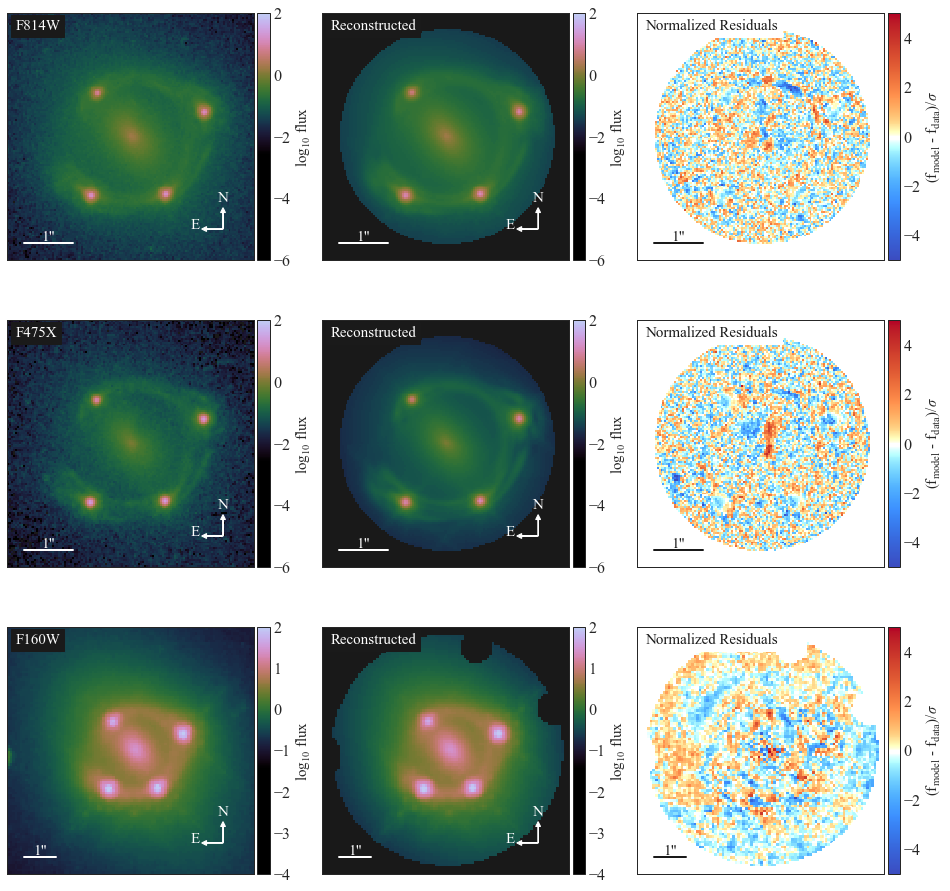

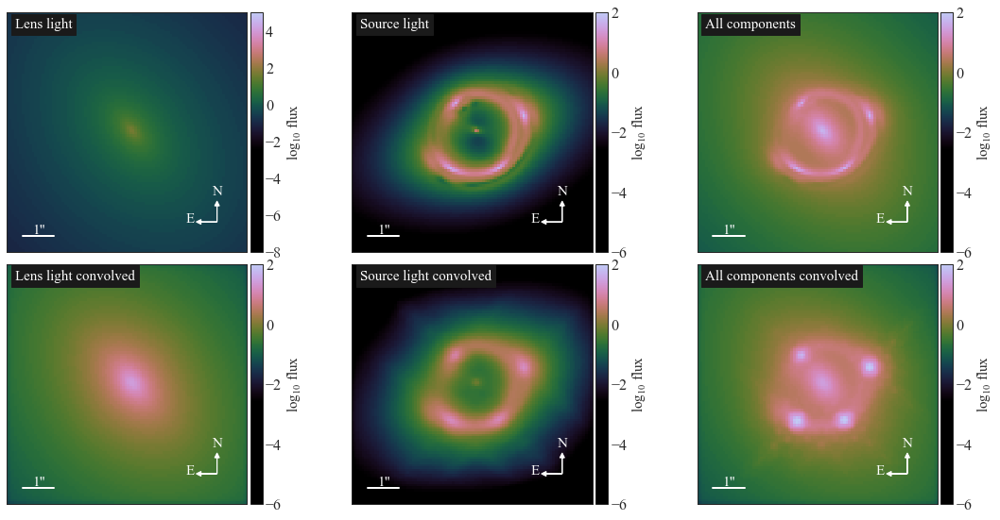

Processing:  2038_run205_1_0_1_0_0
6
n_step: 2000, n_walkers: 432, n_params: 54
-0.9536764609136658 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.9516639705698454
reduced chi^2 of data  1 =  1.0748728324996961
reduced chi^2 of data  2 =  0.7697717450698472


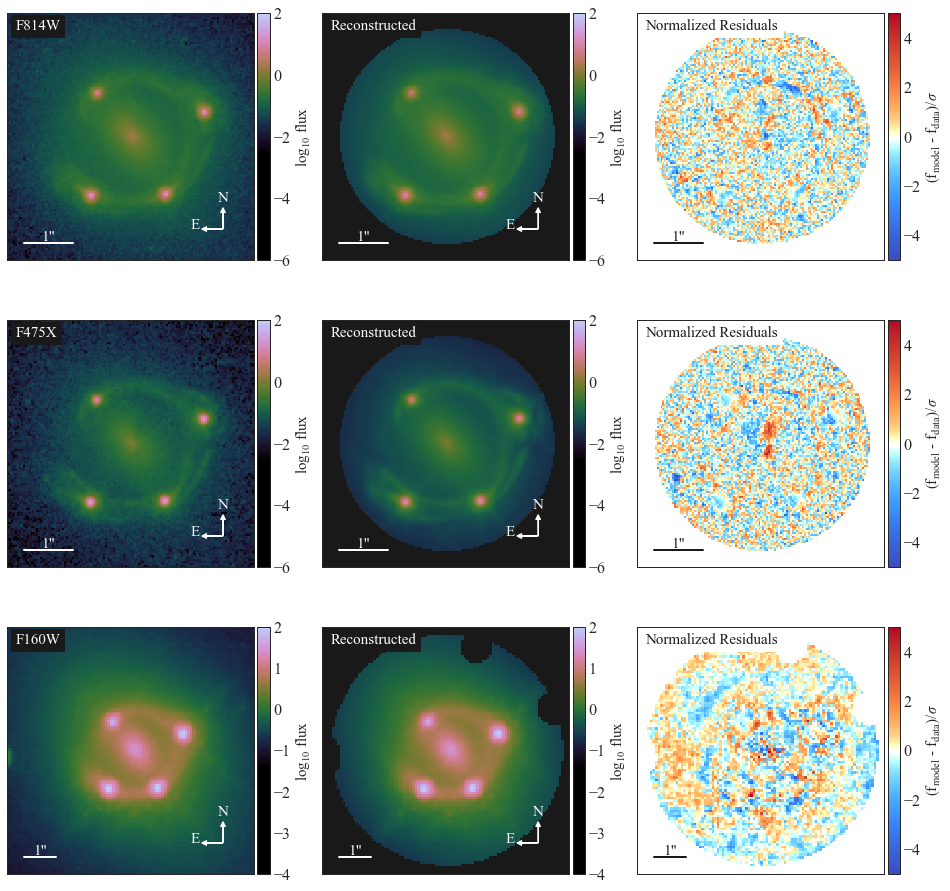

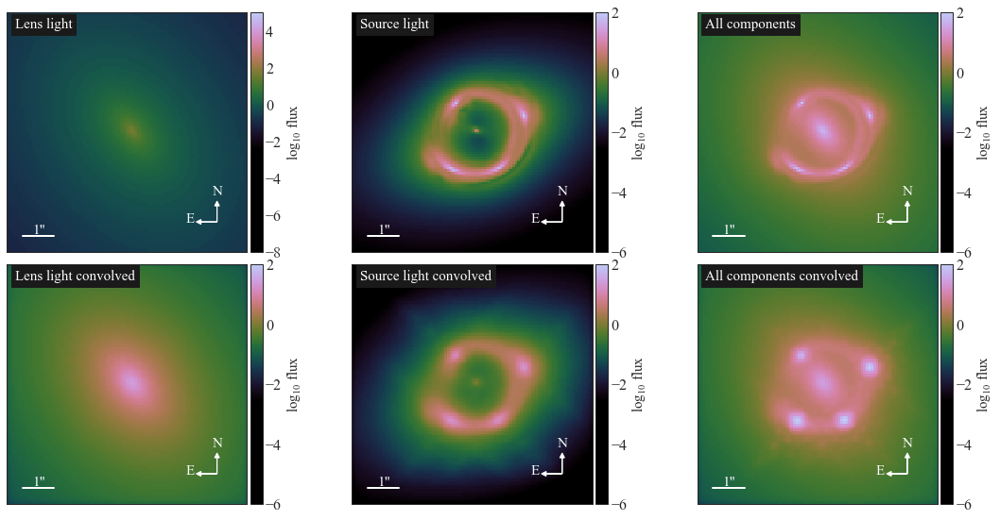

Processing:  2038_run205_1_0_2_0_0
6
n_step: 2000, n_walkers: 432, n_params: 54
-0.9249407716635911 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.918736016612972
reduced chi^2 of data  1 =  1.0525729482832438
reduced chi^2 of data  2 =  0.7375741981416838


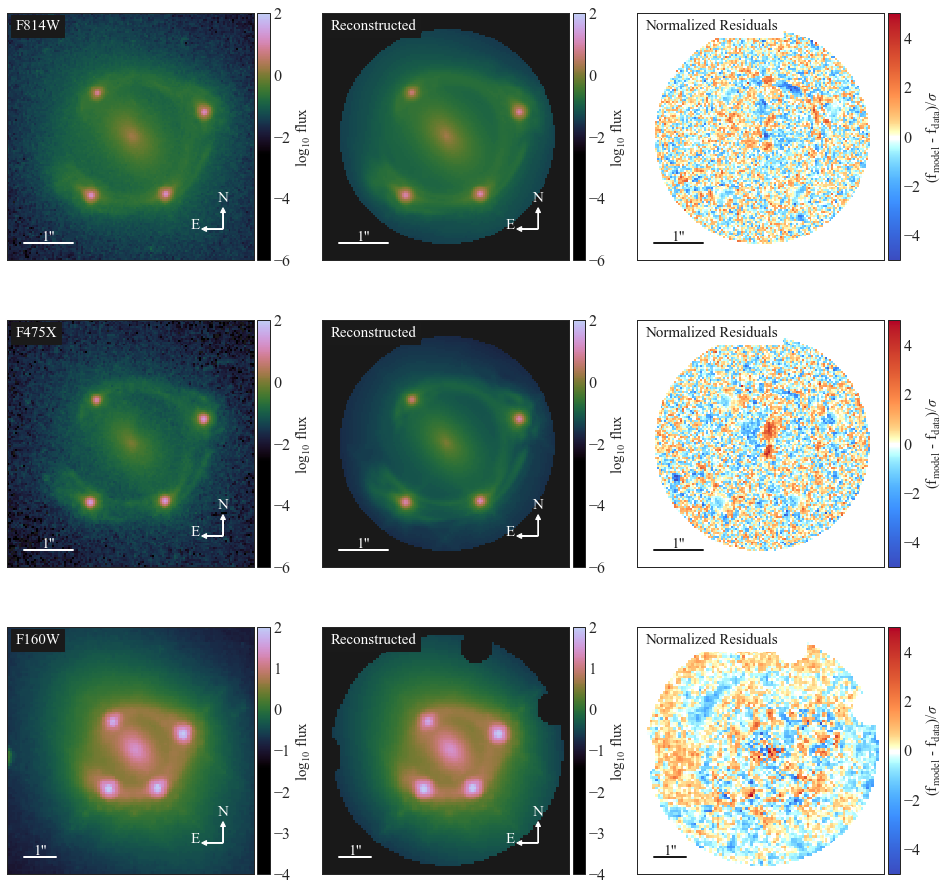

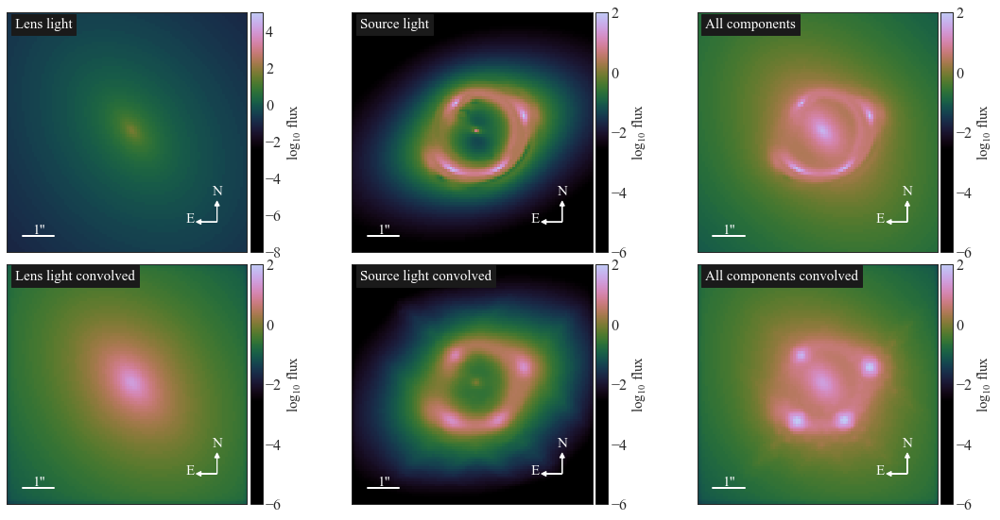

Processing:  2038_run205_1_1_0_0_0
6
n_step: 2000, n_walkers: 432, n_params: 54
-0.9887039911460407 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.9816496676561143
reduced chi^2 of data  1 =  1.0996549278837038
reduced chi^2 of data  2 =  0.8217037374264341


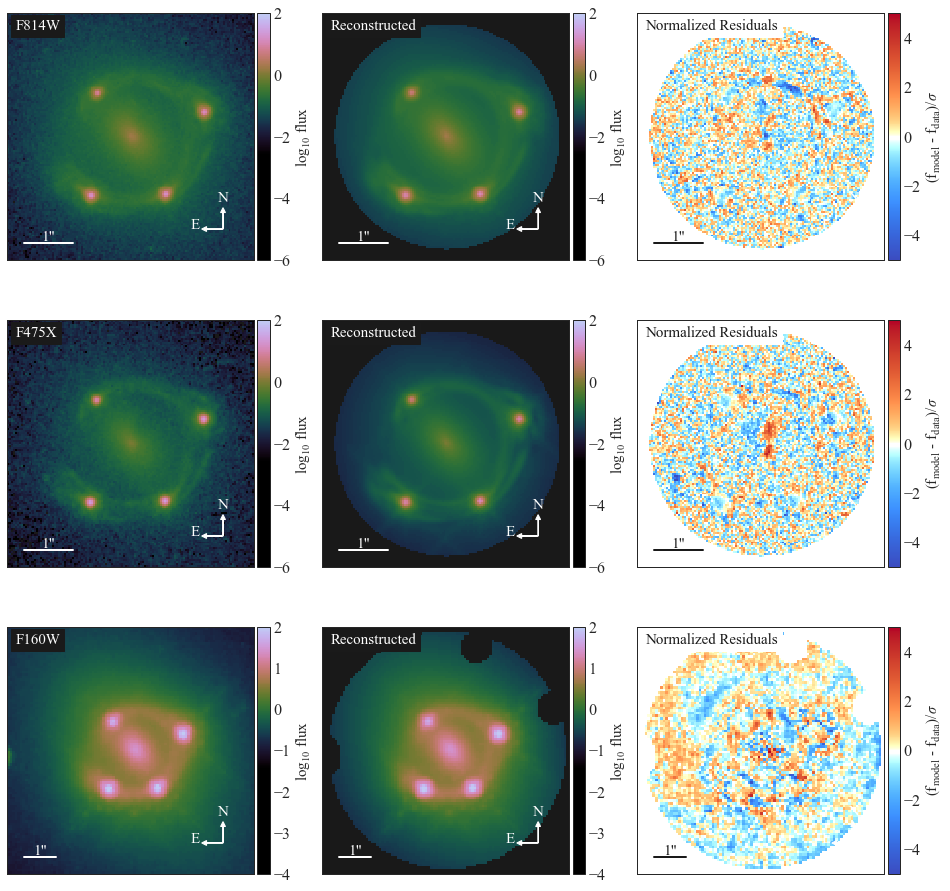

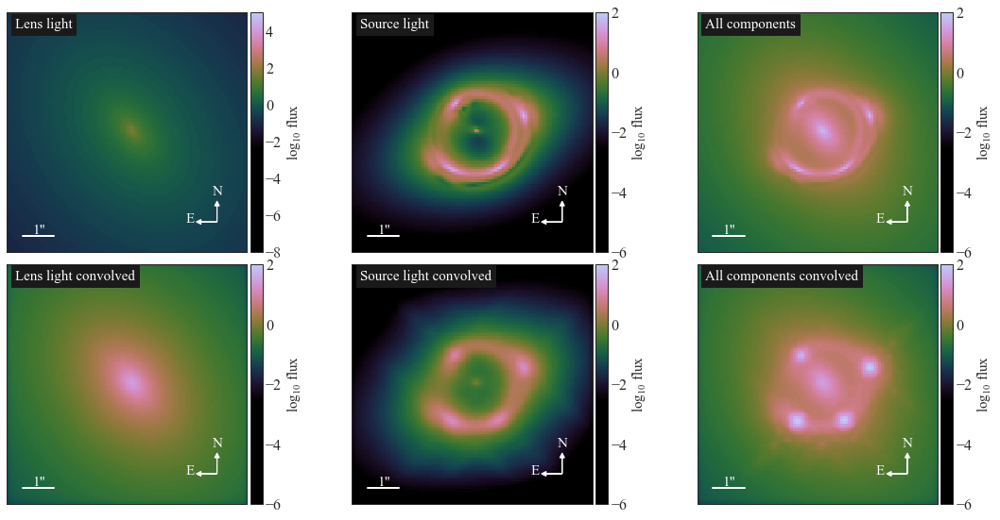

Processing:  2038_run205_1_1_1_0_0
6
n_step: 2000, n_walkers: 432, n_params: 54
-0.955569556594263 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.9700988087473084
reduced chi^2 of data  1 =  1.0730224134231736
reduced chi^2 of data  2 =  0.7434255319163942


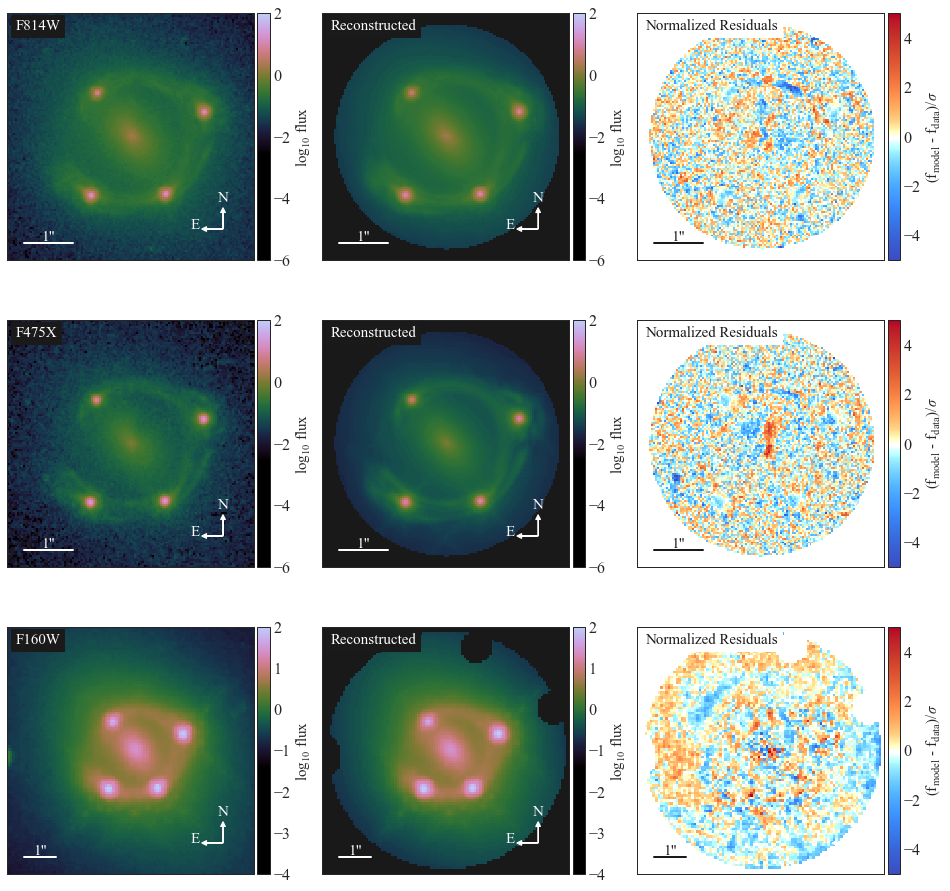

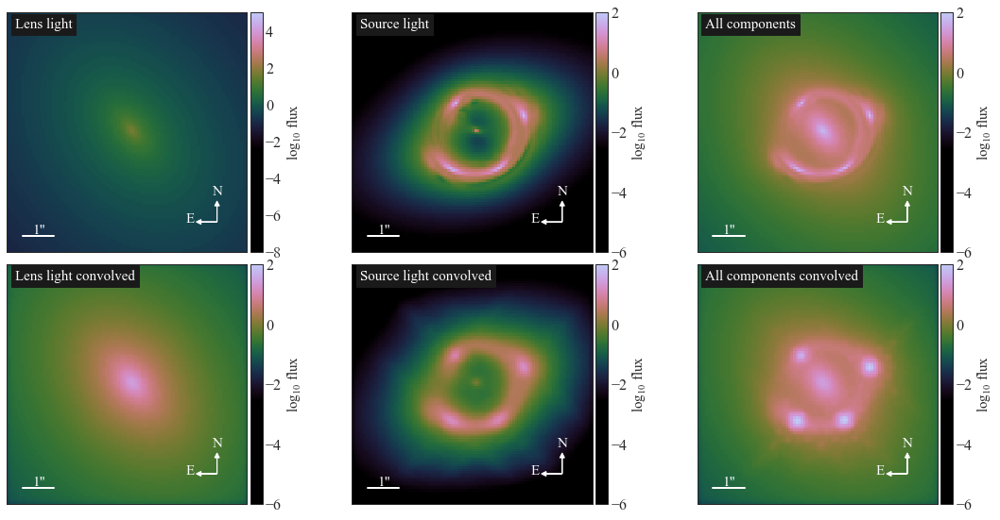

Processing:  2038_run205_1_1_2_0_0
6
n_step: 2000, n_walkers: 432, n_params: 54
-0.9418473820321401 reduced X^2 of all evaluated imaging data combined.
reduced chi^2 of data  0 =  0.9308701284085795
reduced chi^2 of data  1 =  1.0623259842953074
reduced chi^2 of data  2 =  0.7658382472475499


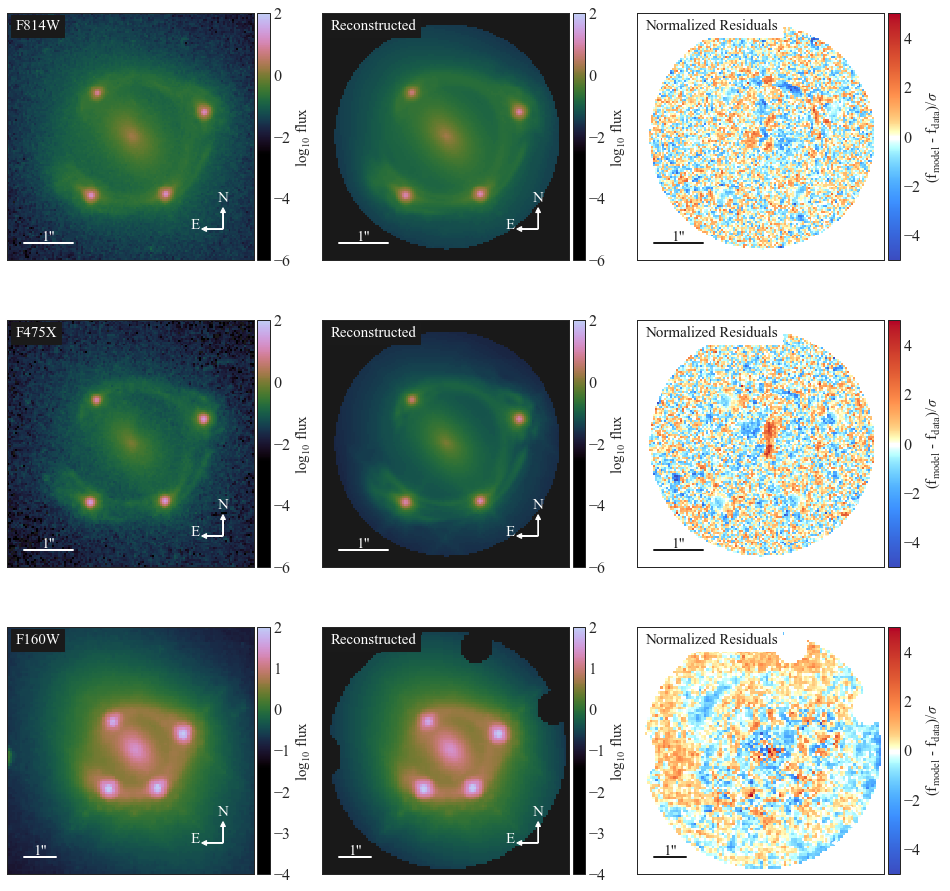

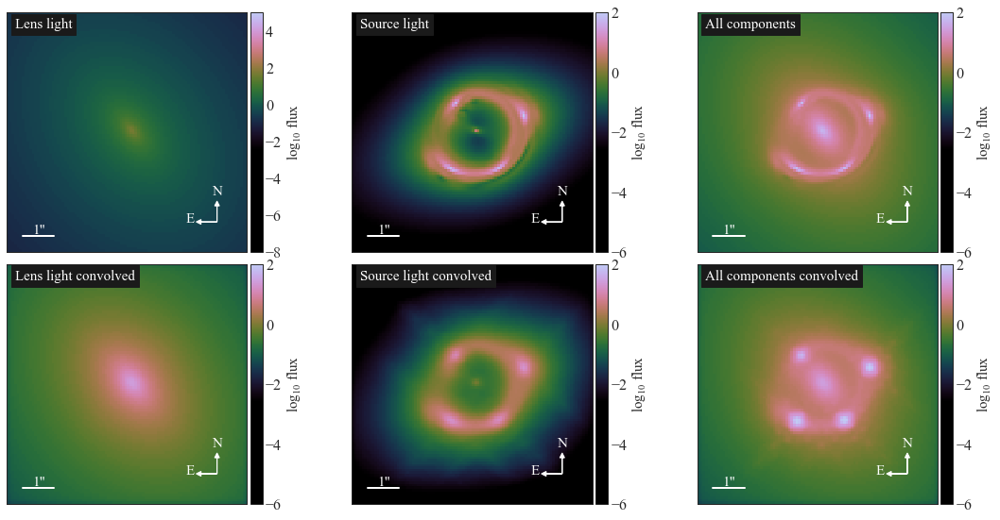

Processing:  2038_run206_1_0_0_0_1


FileNotFoundError: [Errno 2] No such file or directory: '/Users/ajshajib/Research/time_delay_cosmography/J2038/WGD2038-4008/lenstronomy_modeling/temp/2038_run206_1_0_0_0_1_out.txt'

In [8]:
ssh_command = 'ajshajib@hoffman2.idre.ucla.edu'
dir_path = os.getcwd()
dir_path_cluster = '/u/flashscratch/a/ajshajib/'


output_file_list = [
    '2038_run205_1_0_0_0_0',
    '2038_run205_1_0_1_0_0',
    '2038_run205_1_0_2_0_0',
    '2038_run205_1_1_0_0_0',
    '2038_run205_1_1_1_0_0',
    '2038_run205_1_1_2_0_0',
    
    '2038_run206_1_0_0_0_1',
    '2038_run206_1_0_1_0_1',
    '2038_run206_1_0_2_0_1',
    '2038_run206_1_1_0_0_1',
    '2038_run206_1_1_1_0_1',
    '2038_run206_1_1_2_0_1',
]

for job_name_out in output_file_list:
    print("Processing: ", job_name_out)
#    job_name_out = '2038_run109_0_0_0_0_0_0' #job_name

    hoffman2_out = False
    input_temp = os.path.join(base_path, 'temp', job_name_out +'.txt')
    output_temp = os.path.join(base_path, 'temp', job_name_out +'_out.txt')

#     if hoffman2_out is True:
#         path2output_cluster = '/u/flashscratch/a/ajshajib/'+job_name_out+'_out.txt'
#         os_command_output = "scp "+ssh_command+":"+path2output_cluster + " " + output_temp
#         print(os_command_output)
#         os.system(os_command_output)

    f = open(output_temp, 'rb')
    [input_, output_] = joblib.load(f)
    f.close()
    
    fitting_kwargs_list, multi_band_list, kwargs_model, kwargs_constraints, kwargs_likelihood, kwargs_params, init_samples = input_

    kwargs_result, multi_band_list_out, fit_output, _ = output_
        
    samples_mcmc = []
    
    if fit_output[-1][0] != 'PSO':
        mcmc_repeat = 1


        for k in range(len(fit_output)-mcmc_repeat, len(fit_output)):
            print(k)
            if samples_mcmc == []:
                samples_mcmc = fit_output[k][1]
            else:
                samples_mcmc = np.vstack((samples_mcmc, fit_output[k][1]))
            #print(samples_mcmc.shape)
            param_mcmc = fit_output[k][2]
    
    #print(samples_mcmc.shape)
    param_class = Param(kwargs_model,
                        kwargs_params['lens_model'][2], 
                        kwargs_params['source_model'][2],
                        kwargs_params['lens_light_model'][2],
                        kwargs_params['point_source_model'][2],
                        #kwargs_params['special'][2],
                        #kwargs_params['extinction_model'][2],
                        #kwargs_lens_init=kwargs_result['kwargs_lens'],
                        kwargs_lens_init=kwargs_params['lens_model'][0], #fitting_seq._updateManager._lens_init,
                        **kwargs_constraints
                       )

    if not samples_mcmc == []:
        n_params = samples_mcmc.shape[1]

        n_walkers = 8 * n_params
        n_step = int(samples_mcmc.shape[0] / n_walkers)

        print('n_step: {}, n_walkers: {}, n_params: {}'.format(n_step, n_walkers, n_params))

        chain = np.empty((n_walkers, n_step, n_params))

        for i in np.arange(n_params):
            samples = samples_mcmc[:, i].T
            chain[:,:,i] = samples.reshape((n_step, n_walkers)).T

        medians = []

        for i in range(n_params):
            medians.append(np.median(chain[:, -1, i]))
    
        kwargs_result = param_class.args2kwargs(medians)

    lens_plot = ModelPlot(multi_band_list_out, kwargs_model, kwargs_result, arrow_size=0.02, cmap_string=cmap,
                    likelihood_mask_list=kwargs_likelihood['image_likelihood_mask_list'],
                    multi_band_type='multi-linear'#, source_marg=True, linear_prior=[1e5, 1e5, 1e5]
                    )

    f, axes = plt.subplots(3, 3, figsize=(16, 16), sharex=False, sharey=False)

    lens_plot.data_plot(ax=axes[0, 0], band_index=0, v_max= 2, v_min=-6, text='F814W')
    lens_plot.data_plot(ax=axes[1, 0], band_index=1, v_max= 2, v_min=-6, text='F475X')
    lens_plot.data_plot(ax=axes[2, 0], band_index=2, v_max= 2, v_min=-4, text='F160W')

    lens_plot.model_plot(ax=axes[0, 1], band_index=0, v_max= 2, v_min=-6)
    lens_plot.model_plot(ax=axes[1, 1], band_index=1, v_max= 2, v_min=-6)
    lens_plot.model_plot(ax=axes[2, 1], band_index=2, v_max= 2, v_min=-4)

    lens_plot.normalized_residual_plot(ax=axes[0, 2], band_index=0, v_max=5, v_min=-5, cmap=msh_cmap)
    lens_plot.normalized_residual_plot(ax=axes[1, 2], band_index=1, v_max=5, v_min=-5, cmap=msh_cmap)
    lens_plot.normalized_residual_plot(ax=axes[2, 2], band_index=2, v_max=5, v_min=-5, cmap=msh_cmap)

    plt.show()
    
    f, axes = plt.subplots(2, 3, figsize=(16, 8), sharex=False, sharey=False)
    band_i = 2
    lens_plot.decomposition_plot(ax=axes[0,0], text='Lens light', lens_light_add=True, unconvolved=True, cmap=cmap, band_index=band_i, v_min=-8, v_max=5) 
    lens_plot.decomposition_plot(ax=axes[1,0], text='Lens light convolved', lens_light_add=True, band_index=band_i, v_min=-6, v_max=2) 
    lens_plot.decomposition_plot(ax=axes[0,1], text='Source light', source_add=True, unconvolved=True, band_index=band_i, v_min=-6, v_max=2) 
    lens_plot.decomposition_plot(ax=axes[1,1], text='Source light convolved', source_add=True, band_index=band_i, v_min=-6, v_max=2) 
    lens_plot.decomposition_plot(ax=axes[0,2], text='All components', source_add=True, lens_light_add=True, unconvolved=True, band_index=band_i, v_min=-6, v_max=2) 
    lens_plot.decomposition_plot(ax=axes[1,2], text='All components convolved', source_add=True, lens_light_add=True, point_source_add=True, band_index=band_i, v_min=-6, v_max=2) 
    f.tight_layout()
    f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0., hspace=0.05)
    plt.show()

## Check MCMC chains

Processing:  2038_run205_1_0_0_0_0


/Users/ajshajib/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


n_step: 2000, n_walkers: 432, n_params: 54
Rs_lens0 20.4852 ± 2.7135
gamma1_lens1 0.0769 ± 0.0082
gamma2_lens1 -0.0869 ± 0.0060
alpha_1_lens2 1.0430 ± 0.0185
R_sersic_source_light0 0.1495 ± 0.0039
n_sersic_source_light0 0.8132 ± 0.0376
e1_source_light0 0.2402 ± 0.0052
e2_source_light0 -0.0993 ± 0.0044
beta_source_light1 0.0775 ± 0.0014
R_sersic_source_light2 0.1364 ± 0.0048
n_sersic_source_light2 0.7125 ± 0.0422
beta_source_light3 0.0743 ± 0.0019
R_sersic_source_light4 0.3394 ± 0.0171
n_sersic_source_light4 3.0363 ± 0.2013
beta_source_light5 0.1297 ± 0.0027
R_sersic_lens_light0 0.5690 ± 0.0175
n_sersic_lens_light0 1.3758 ± 0.0603
e1_lens_light0 -0.0901 ± 0.0046
e2_lens_light0 0.2838 ± 0.0047
center_x_lens_light0 -0.0035 ± 0.0003
center_y_lens_light0 -0.0077 ± 0.0004
R_sersic_lens_light1 2.4136 ± 0.2248
n_sersic_lens_light1 1.0310 ± 0.1448
e1_lens_light1 0.0014 ± 0.0060
e2_lens_light1 0.0690 ± 0.0073
R_sersic_lens_light2 6.3101 ± 0.2732
n_sersic_lens_light2 7.6146 ± 0.4634
e1_lens_light

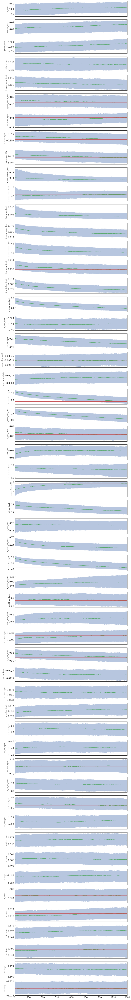

Processing:  2038_run205_1_0_1_0_0


/Users/ajshajib/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


n_step: 2000, n_walkers: 432, n_params: 54
Rs_lens0 20.7770 ± 2.7172
gamma1_lens1 0.0747 ± 0.0271
gamma2_lens1 -0.1040 ± 0.0182
alpha_1_lens2 1.0881 ± 0.0188
R_sersic_source_light0 0.1498 ± 0.0050
n_sersic_source_light0 0.5464 ± 0.0205
e1_source_light0 0.2358 ± 0.0085
e2_source_light0 -0.1094 ± 0.0049
beta_source_light1 0.0766 ± 0.0016
R_sersic_source_light2 0.1369 ± 0.0037
n_sersic_source_light2 0.6187 ± 0.0296
beta_source_light3 0.0767 ± 0.0017
R_sersic_source_light4 0.3917 ± 0.0591
n_sersic_source_light4 4.7119 ± 1.1480
beta_source_light5 0.1278 ± 0.0034
R_sersic_lens_light0 0.4938 ± 0.0136
n_sersic_lens_light0 0.9501 ± 0.0727
e1_lens_light0 0.0359 ± 0.0086
e2_lens_light0 0.2751 ± 0.0073
center_x_lens_light0 -0.0035 ± 0.0003
center_y_lens_light0 -0.0056 ± 0.0003
R_sersic_lens_light1 1.9707 ± 0.0828
n_sersic_lens_light1 0.6749 ± 0.0585
e1_lens_light1 0.1115 ± 0.0130
e2_lens_light1 -0.0180 ± 0.0129
R_sersic_lens_light2 5.7001 ± 0.6462
n_sersic_lens_light2 5.1633 ± 0.2851
e1_lens_light

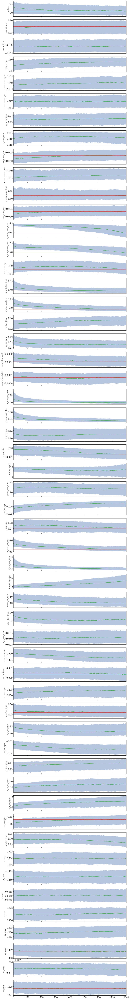

Processing:  2038_run205_1_0_2_0_0


/Users/ajshajib/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


n_step: 2000, n_walkers: 432, n_params: 54
Rs_lens0 22.8394 ± 2.8890
gamma1_lens1 0.0488 ± 0.0329
gamma2_lens1 -0.1188 ± 0.0136
alpha_1_lens2 1.0600 ± 0.0170
R_sersic_source_light0 0.1568 ± 0.0055
n_sersic_source_light0 1.1592 ± 0.1274
e1_source_light0 0.2240 ± 0.0070
e2_source_light0 -0.0860 ± 0.0049
beta_source_light1 0.0809 ± 0.0012
R_sersic_source_light2 0.1266 ± 0.0053
n_sersic_source_light2 1.1212 ± 0.3581
beta_source_light3 0.0780 ± 0.0014
R_sersic_source_light4 0.3078 ± 0.0190
n_sersic_source_light4 3.6913 ± 0.3058
beta_source_light5 0.1217 ± 0.0028
R_sersic_lens_light0 0.5150 ± 0.0127
n_sersic_lens_light0 1.0468 ± 0.0716
e1_lens_light0 0.0193 ± 0.0106
e2_lens_light0 0.2866 ± 0.0084
center_x_lens_light0 -0.0029 ± 0.0004
center_y_lens_light0 -0.0056 ± 0.0004
R_sersic_lens_light1 2.3967 ± 0.2184
n_sersic_lens_light1 1.0030 ± 0.1523
e1_lens_light1 0.0905 ± 0.0167
e2_lens_light1 0.0452 ± 0.0150
R_sersic_lens_light2 5.3728 ± 1.0347
n_sersic_lens_light2 5.2055 ± 0.4170
e1_lens_light2

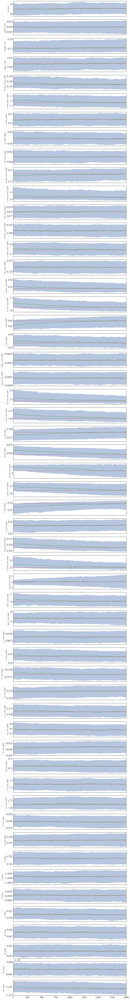

Processing:  2038_run205_1_1_0_0_0


/Users/ajshajib/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


n_step: 2000, n_walkers: 432, n_params: 54
Rs_lens0 22.8649 ± 2.9457
gamma1_lens1 0.0416 ± 0.0253
gamma2_lens1 -0.1263 ± 0.0082
alpha_1_lens2 1.1236 ± 0.0195
R_sersic_source_light0 0.1533 ± 0.0033
n_sersic_source_light0 0.7644 ± 0.0383
e1_source_light0 0.2393 ± 0.0065
e2_source_light0 -0.1089 ± 0.0037
beta_source_light1 0.0796 ± 0.0012
R_sersic_source_light2 0.1423 ± 0.0092
n_sersic_source_light2 0.6657 ± 0.3794
beta_source_light3 0.0775 ± 0.0089
R_sersic_source_light4 0.3373 ± 0.0164
n_sersic_source_light4 3.1019 ± 0.2132
beta_source_light5 0.1308 ± 0.0025
R_sersic_lens_light0 0.5180 ± 0.0144
n_sersic_lens_light0 1.1142 ± 0.0737
e1_lens_light0 0.0164 ± 0.0094
e2_lens_light0 0.2815 ± 0.0065
center_x_lens_light0 -0.0031 ± 0.0003
center_y_lens_light0 -0.0055 ± 0.0003
R_sersic_lens_light1 2.2138 ± 0.1220
n_sersic_lens_light1 0.8725 ± 0.0874
e1_lens_light1 0.0852 ± 0.0108
e2_lens_light1 0.0302 ± 0.0117
R_sersic_lens_light2 5.4210 ± 0.7105
n_sersic_lens_light2 5.2458 ± 0.3887
e1_lens_light2

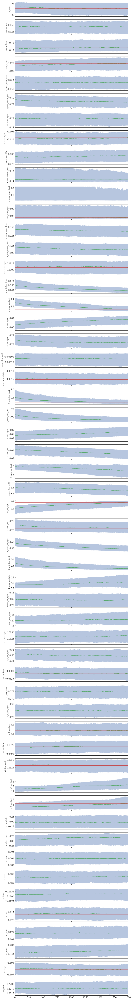

Processing:  2038_run205_1_1_1_0_0


/Users/ajshajib/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


n_step: 2000, n_walkers: 432, n_params: 54
Rs_lens0 22.6106 ± 3.1921
gamma1_lens1 0.0525 ± 0.0308
gamma2_lens1 -0.1153 ± 0.0133
alpha_1_lens2 1.0771 ± 0.0182
R_sersic_source_light0 0.1559 ± 0.0056
n_sersic_source_light0 0.7087 ± 0.0553
e1_source_light0 0.2306 ± 0.0058
e2_source_light0 -0.0989 ± 0.0047
beta_source_light1 0.0744 ± 0.0014
R_sersic_source_light2 0.1325 ± 0.0026
n_sersic_source_light2 0.6431 ± 0.0248
beta_source_light3 0.0739 ± 0.0013
R_sersic_source_light4 0.3165 ± 0.0160
n_sersic_source_light4 3.2089 ± 0.2444
beta_source_light5 0.1187 ± 0.0022
R_sersic_lens_light0 0.5706 ± 0.0135
n_sersic_lens_light0 1.3035 ± 0.0527
e1_lens_light0 -0.0958 ± 0.0083
e2_lens_light0 0.2847 ± 0.0059
center_x_lens_light0 -0.0033 ± 0.0003
center_y_lens_light0 -0.0062 ± 0.0003
R_sersic_lens_light1 1.4289 ± 0.6189
n_sersic_lens_light1 6.3567 ± 1.1470
e1_lens_light1 0.2756 ± 0.0445
e2_lens_light1 0.2177 ± 0.0262
R_sersic_lens_light2 2.3065 ± 0.1312
n_sersic_lens_light2 0.9404 ± 0.1044
e1_lens_light

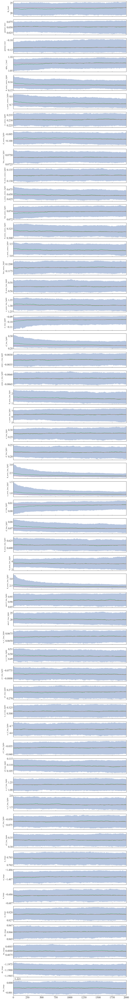

Processing:  2038_run205_1_1_2_0_0


/Users/ajshajib/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


n_step: 2000, n_walkers: 432, n_params: 54
Rs_lens0 22.9385 ± 2.6534
gamma1_lens1 0.0336 ± 0.0287
gamma2_lens1 -0.1246 ± 0.0095
alpha_1_lens2 1.0785 ± 0.0437
R_sersic_source_light0 0.1932 ± 0.0151
n_sersic_source_light0 1.9123 ± 0.2704
e1_source_light0 0.2424 ± 0.0086
e2_source_light0 -0.0927 ± 0.0051
beta_source_light1 0.0813 ± 0.0013
R_sersic_source_light2 0.1297 ± 0.0054
n_sersic_source_light2 1.7168 ± 0.2826
beta_source_light3 0.0774 ± 0.0013
R_sersic_source_light4 0.2890 ± 0.0141
n_sersic_source_light4 3.3934 ± 0.3533
beta_source_light5 0.1173 ± 0.0028
R_sersic_lens_light0 0.5352 ± 0.0132
n_sersic_lens_light0 1.1128 ± 0.0680
e1_lens_light0 -0.1311 ± 0.0076
e2_lens_light0 0.3247 ± 0.0092
center_x_lens_light0 -0.0033 ± 0.0003
center_y_lens_light0 -0.0060 ± 0.0003
R_sersic_lens_light1 3.7011 ± 0.1240
n_sersic_lens_light1 5.9294 ± 0.6052
e1_lens_light1 0.2388 ± 0.0399
e2_lens_light1 0.2533 ± 0.0203
R_sersic_lens_light2 4.8843 ± 0.0919
n_sersic_lens_light2 2.7216 ± 0.1571
e1_lens_light

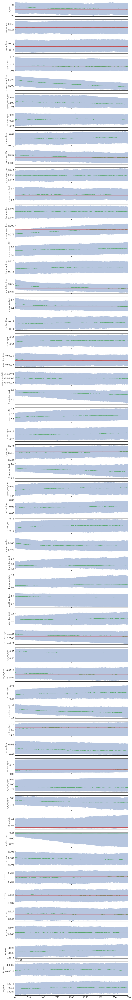

Processing:  2038_run206_1_0_0_0_0


/Users/ajshajib/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


n_step: 2000, n_walkers: 432, n_params: 54
Rs_lens0 23.2781 ± 2.9407
gamma1_lens1 0.0533 ± 0.0240
gamma2_lens1 -0.1243 ± 0.0120
alpha_1_lens2 1.0980 ± 0.0187
R_sersic_source_light0 0.1537 ± 0.0028
n_sersic_source_light0 0.7560 ± 0.0408
e1_source_light0 0.2550 ± 0.0112
e2_source_light0 -0.1130 ± 0.0053
beta_source_light1 0.0797 ± 0.0014
R_sersic_source_light2 0.1427 ± 0.0036
n_sersic_source_light2 0.6707 ± 0.0338
beta_source_light3 0.0769 ± 0.0016
R_sersic_source_light4 0.4136 ± 0.0393
n_sersic_source_light4 3.8096 ± 0.4993
beta_source_light5 0.1325 ± 0.0032
R_sersic_lens_light0 0.5054 ± 0.0276
n_sersic_lens_light0 1.0393 ± 0.1590
e1_lens_light0 0.0226 ± 0.0126
e2_lens_light0 0.2763 ± 0.0089
center_x_lens_light0 -0.0028 ± 0.0003
center_y_lens_light0 -0.0054 ± 0.0003
R_sersic_lens_light1 2.0421 ± 0.4168
n_sersic_lens_light1 0.7587 ± 0.2404
e1_lens_light1 0.0919 ± 0.0139
e2_lens_light1 0.0149 ± 0.0150
R_sersic_lens_light2 5.4954 ± 0.7230
n_sersic_lens_light2 5.1934 ± 0.3865
e1_lens_light2

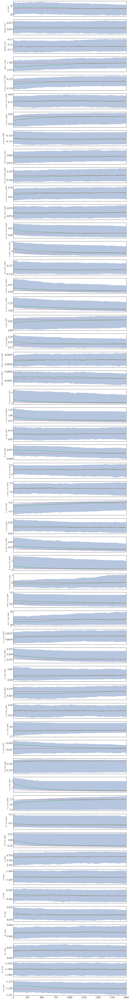

Processing:  2038_run206_1_0_1_0_0


/Users/ajshajib/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


n_step: 2000, n_walkers: 432, n_params: 54
Rs_lens0 23.2864 ± 2.6184
gamma1_lens1 0.0420 ± 0.0284
gamma2_lens1 -0.1231 ± 0.0126
alpha_1_lens2 1.0735 ± 0.0225
R_sersic_source_light0 0.1567 ± 0.0058
n_sersic_source_light0 0.6041 ± 0.0659
e1_source_light0 0.2226 ± 0.0080
e2_source_light0 -0.0975 ± 0.0052
beta_source_light1 0.0741 ± 0.0013
R_sersic_source_light2 0.1299 ± 0.0027
n_sersic_source_light2 0.6136 ± 0.0284
beta_source_light3 0.0720 ± 0.0012
R_sersic_source_light4 0.2932 ± 0.0106
n_sersic_source_light4 3.4322 ± 0.2941
beta_source_light5 0.1177 ± 0.0018
R_sersic_lens_light0 0.6432 ± 0.0750
n_sersic_lens_light0 1.5269 ± 0.1737
e1_lens_light0 -0.1253 ± 0.0082
e2_lens_light0 0.3127 ± 0.0081
center_x_lens_light0 -0.0033 ± 0.0003
center_y_lens_light0 -0.0059 ± 0.0004
R_sersic_lens_light1 3.8581 ± 0.2670
n_sersic_lens_light1 6.4759 ± 0.8417
e1_lens_light1 0.3020 ± 0.0395
e2_lens_light1 0.2801 ± 0.0240
R_sersic_lens_light2 3.9444 ± 0.5493
n_sersic_lens_light2 1.8915 ± 0.1480
e1_lens_light

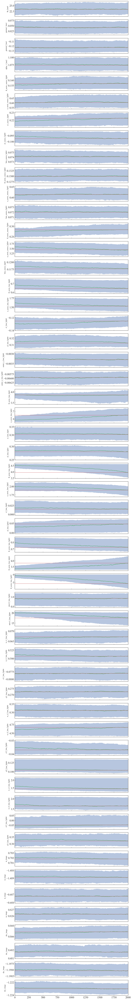

Processing:  2038_run206_1_0_2_0_0


/Users/ajshajib/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


n_step: 2000, n_walkers: 432, n_params: 54
Rs_lens0 23.8762 ± 2.4435
gamma1_lens1 0.0394 ± 0.0110
gamma2_lens1 -0.1113 ± 0.0034
alpha_1_lens2 0.9736 ± 0.0256
R_sersic_source_light0 0.2073 ± 0.0291
n_sersic_source_light0 2.3685 ± 0.6675
e1_source_light0 0.2395 ± 0.0089
e2_source_light0 -0.0862 ± 0.0054
beta_source_light1 0.0782 ± 0.0015
R_sersic_source_light2 0.1434 ± 0.0125
n_sersic_source_light2 5.8246 ± 1.0786
beta_source_light3 0.0747 ± 0.0013
R_sersic_source_light4 0.3121 ± 0.0160
n_sersic_source_light4 4.3071 ± 0.3250
beta_source_light5 0.1147 ± 0.0029
R_sersic_lens_light0 0.5300 ± 0.0112
n_sersic_lens_light0 0.9443 ± 0.0717
e1_lens_light0 -0.1538 ± 0.0079
e2_lens_light0 0.3356 ± 0.0073
center_x_lens_light0 -0.0029 ± 0.0004
center_y_lens_light0 -0.0069 ± 0.0004
R_sersic_lens_light1 3.0707 ± 0.0763
n_sersic_lens_light1 3.8176 ± 0.1684
e1_lens_light1 0.0727 ± 0.0209
e2_lens_light1 0.2047 ± 0.0125
R_sersic_lens_light2 6.1305 ± 0.1448
n_sersic_lens_light2 2.5008 ± 0.3177
e1_lens_light

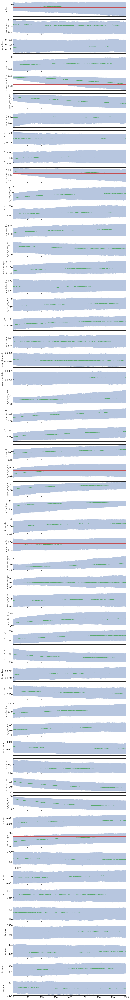

Processing:  2038_run206_1_1_0_0_0


/Users/ajshajib/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


n_step: 2000, n_walkers: 432, n_params: 54
Rs_lens0 26.0600 ± 1.5299
gamma1_lens1 0.0364 ± 0.0006
gamma2_lens1 -0.1050 ± 0.0010
alpha_1_lens2 0.9999 ± 0.0134
R_sersic_source_light0 0.1432 ± 0.0081
n_sersic_source_light0 0.7385 ± 1.7665
e1_source_light0 0.2211 ± 0.0083
e2_source_light0 -0.0956 ± 0.0089
beta_source_light1 0.0776 ± 0.0062
R_sersic_source_light2 0.1528 ± 0.0488
n_sersic_source_light2 5.8902 ± 3.8598
beta_source_light3 0.0940 ± 0.0022
R_sersic_source_light4 0.3810 ± 0.0398
n_sersic_source_light4 3.4224 ± 0.4852
beta_source_light5 0.1342 ± 0.0029
R_sersic_lens_light0 0.6034 ± 0.0362
n_sersic_lens_light0 1.5711 ± 0.0882
e1_lens_light0 -0.0173 ± 0.0186
e2_lens_light0 0.2791 ± 0.0073
center_x_lens_light0 -0.0029 ± 0.0003
center_y_lens_light0 -0.0072 ± 0.0004
R_sersic_lens_light1 2.9674 ± 0.1971
n_sersic_lens_light1 1.2169 ± 0.0937
e1_lens_light1 0.0664 ± 0.0098
e2_lens_light1 0.0423 ± 0.0120
R_sersic_lens_light2 5.1757 ± 0.4983
n_sersic_lens_light2 4.2918 ± 1.2928
e1_lens_light

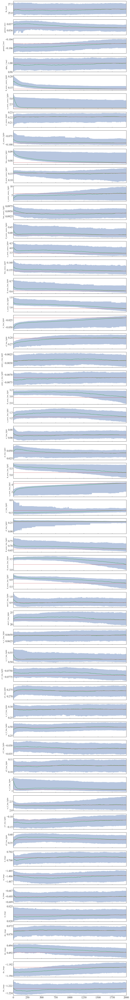

Processing:  2038_run206_1_1_1_0_0


/Users/ajshajib/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


n_step: 2000, n_walkers: 432, n_params: 54
Rs_lens0 13.3204 ± 2.1246
gamma1_lens1 0.0422 ± 0.0082
gamma2_lens1 -0.1056 ± 0.0038
alpha_1_lens2 1.0278 ± 0.0180
R_sersic_source_light0 0.1861 ± 0.0137
n_sersic_source_light0 1.2599 ± 0.1424
e1_source_light0 0.2383 ± 0.0071
e2_source_light0 -0.0829 ± 0.0070
beta_source_light1 0.0797 ± 0.0023
R_sersic_source_light2 0.1403 ± 0.0094
n_sersic_source_light2 1.3381 ± 0.5350
beta_source_light3 0.0784 ± 0.0018
R_sersic_source_light4 0.2970 ± 0.0120
n_sersic_source_light4 3.3524 ± 0.2704
beta_source_light5 0.1188 ± 0.0025
R_sersic_lens_light0 0.5627 ± 0.0148
n_sersic_lens_light0 1.1763 ± 0.0700
e1_lens_light0 -0.1460 ± 0.0074
e2_lens_light0 0.3297 ± 0.0065
center_x_lens_light0 -0.0030 ± 0.0003
center_y_lens_light0 -0.0069 ± 0.0004
R_sersic_lens_light1 3.1811 ± 0.1034
n_sersic_lens_light1 4.8247 ± 0.2665
e1_lens_light1 0.1849 ± 0.0289
e2_lens_light1 0.2566 ± 0.0170
R_sersic_lens_light2 5.6253 ± 0.1061
n_sersic_lens_light2 2.6961 ± 0.1244
e1_lens_light

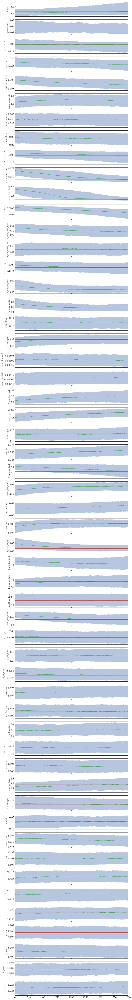

Processing:  2038_run206_1_1_2_0_0


/Users/ajshajib/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:56: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.


n_step: 1143, n_walkers: 432, n_params: 54
Rs_lens0 21.5877 ± 1.0737
gamma1_lens1 0.0314 ± 0.0010
gamma2_lens1 -0.1018 ± 0.0055
alpha_1_lens2 1.0700 ± 0.0380
R_sersic_source_light0 0.1686 ± 0.0082
n_sersic_source_light0 1.6826 ± 0.2301
e1_source_light0 0.2285 ± 0.0074
e2_source_light0 -0.0763 ± 0.0054
beta_source_light1 0.0837 ± 0.0022
R_sersic_source_light2 0.1216 ± 0.0138
n_sersic_source_light2 2.1744 ± 1.4729
beta_source_light3 0.0802 ± 0.0019
R_sersic_source_light4 0.2548 ± 0.0126
n_sersic_source_light4 2.8046 ± 0.2406
beta_source_light5 0.1195 ± 0.0022
R_sersic_lens_light0 0.5309 ± 0.0234
n_sersic_lens_light0 1.1795 ± 0.1057
e1_lens_light0 -0.0027 ± 0.0066
e2_lens_light0 0.2983 ± 0.0080
center_x_lens_light0 -0.0043 ± 0.0003
center_y_lens_light0 -0.0070 ± 0.0004
R_sersic_lens_light1 3.4193 ± 0.3068
n_sersic_lens_light1 1.6210 ± 0.1504
e1_lens_light1 0.0549 ± 0.0131
e2_lens_light1 0.0927 ± 0.0116
R_sersic_lens_light2 5.6005 ± 0.3511
n_sersic_lens_light2 5.7679 ± 0.4702
e1_lens_light

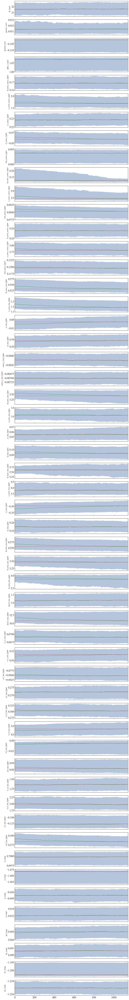

In [7]:
ssh_command = 'ajshajib@hoffman2.idre.ucla.edu'
dir_path = os.getcwd()
dir_path_cluster = '/u/flashscratch/a/ajshajib/'


output_file_list = [
    '2038_run205_1_0_0_0_0',
    '2038_run205_1_0_1_0_0',
    '2038_run205_1_0_2_0_0',
    '2038_run205_1_1_0_0_0',
    '2038_run205_1_1_1_0_0',
    '2038_run205_1_1_2_0_0',
    
    '2038_run206_1_0_0_0_0',
    '2038_run206_1_0_1_0_0',
    '2038_run206_1_0_2_0_0',
    '2038_run206_1_1_0_0_0',
    '2038_run206_1_1_1_0_0',
    '2038_run206_1_1_2_0_0',
]

for job_name_out in output_file_list:
    print("Processing: ", job_name_out)

    hoffman2_out = False
    input_temp = os.path.join(base_path, 'temp', job_name_out +'.txt')
    output_temp = os.path.join(base_path, 'temp', job_name_out +'_out.txt')

#     if hoffman2_out is True:
#         path2output_cluster = '/u/flashscratch/a/ajshajib/'+job_name_out+'_out.txt'
#         os_command_output = "scp "+ssh_command+":"+path2output_cluster + " " + output_temp
#         print(os_command_output)
#         os.system(os_command_output)

    f = open(output_temp, 'rb')
    [input_, output_] = joblib.load(f)
    f.close()
    
    fitting_kwargs_list, multi_band_list, kwargs_model, kwargs_constraints, kwargs_likelihood, kwargs_params, init_samples = input_

    kwargs_result, multi_band_list_out, fit_output, _ = output_

    if fit_output[-1][0] != 'PSO':
        mcmc_repeat = 1

        samples_mcmc = []

        for k in range(len(fit_output)-mcmc_repeat, len(fit_output)):
            if samples_mcmc == []:
                samples_mcmc = fit_output[k][1]
            else:
                samples_mcmc = np.vstack((samples_mcmc, fit_output[k][1]))
            #print(samples_mcmc.shape)
            param_mcmc = fit_output[k][2]

    if not samples_mcmc == []:
        n_params = samples_mcmc.shape[1]

        n_walkers = 8 * n_params
        n_step = int(samples_mcmc.shape[0] / n_walkers)

        print('n_step: {}, n_walkers: {}, n_params: {}'.format(n_step, n_walkers, n_params))

        chain = np.empty((n_walkers, n_step, n_params))

        for i in np.arange(n_params):
            samples = samples_mcmc[:, i].T
            chain[:,:,i] = samples.reshape((n_step, n_walkers)).T

        mean_pos = np.zeros((n_params, n_step))
        median_pos = np.zeros((n_params, n_step))
        std_pos = np.zeros((n_params, n_step))
        q16_pos = np.zeros((n_params, n_step))
        q84_pos = np.zeros((n_params, n_step))

        for i in np.arange(n_params):
            for j in np.arange(n_step):
                mean_pos[i][j] = np.mean(chain[:, j, i])
                median_pos[i][j] = np.median(chain[:, j, i])
                std_pos[i][j] = np.std(chain[:, j, i])
                q16_pos[i][j] = np.percentile(chain[:, j, i], 16.)
                q84_pos[i][j] = np.percentile(chain[:, j, i], 84.)

        fig, ax = plt.subplots(n_params, sharex=True, figsize=(8, 6))

        burnin = -1
        last = n_step

        medians = []

        param_values = [median_pos[0][last-1], (q84_pos[0][last-1]-q16_pos[0][last-1])/2,
                        median_pos[1][last-1], (q84_pos[1][last-1]-q16_pos[1][last-1])/2]

        for i in range(n_params):
            print(param_mcmc[i], '{:.4f} ± {:.4f}'.format(median_pos[i][last-1], (q84_pos[i][last-1]-q16_pos[i][last-1])/2))
            
            ax[i].plot(median_pos[i][:last], c='g')
            ax[i].axhline(np.median(median_pos[i][burnin:last]), c='r', lw=1)
            ax[i].fill_between(np.arange(last), q84_pos[i][:last], q16_pos[i][:last], alpha=0.4)
            ax[i].set_ylabel(param_mcmc[i], fontsize=10)
            ax[i].set_xlim(0, last)

            medians.append(np.median(median_pos[i][burnin:last]))

        if True:
            fig.set_size_inches((12., 2*len(param_mcmc)))
            plt.show()
            
        gc.collect()